In [71]:
import pandas as pd
import numpy as np

from scipy.stats import multivariate_normal as mvn

import matplotlib.pyplot as plt

import seaborn as sns


In [72]:
import timeit

In [73]:
df = pd.read_csv("C:\\Users\\liamh\\Downloads\\MNIST_train.csv")


In [74]:
del df["Unnamed: 0"]

In [75]:
df = df.to_numpy()
df

array([[    0,     5,     0, ...,     0,     0,     0],
       [    1,     0,     0, ...,     0,     0,     0],
       [    2,     4,     0, ...,     0,     0,     0],
       ...,
       [59997,     5,     0, ...,     0,     0,     0],
       [59998,     6,     0, ...,     0,     0,     0],
       [59999,     8,     0, ...,     0,     0,     0]], dtype=int64)

In [76]:
XNot = df[:,2:]
y = df[:,1]


In [77]:
XNot.shape

(60000, 784)

In [78]:
X = []
for i in range(len(XNot)):
    X.append(XNot[i].reshape(28,28))

In [79]:
X = np.array(X)
X.shape

(60000, 28, 28)

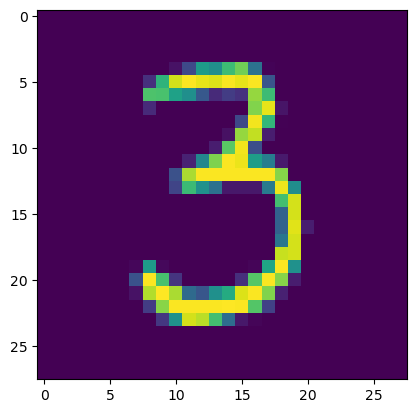

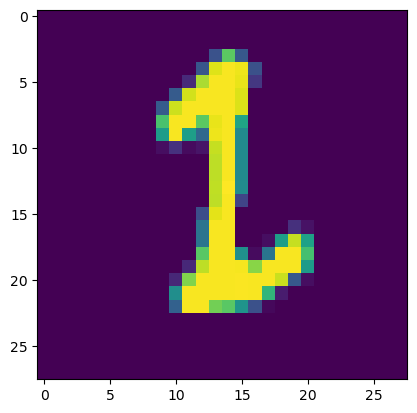

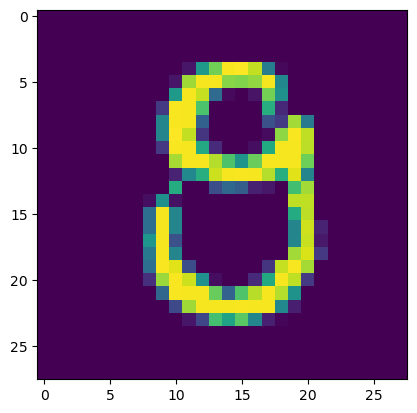

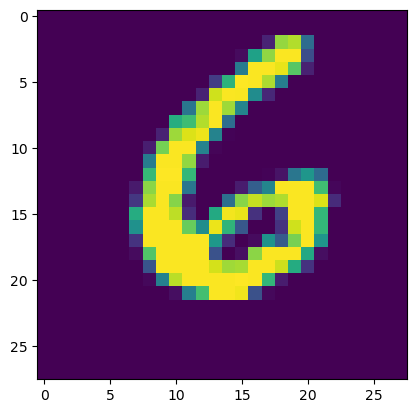

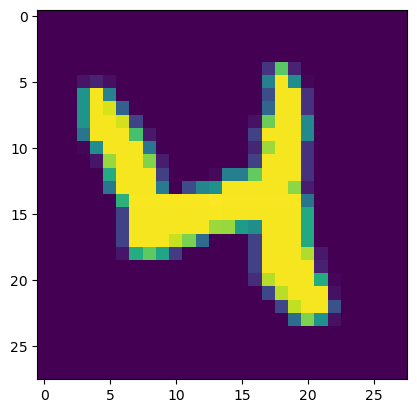

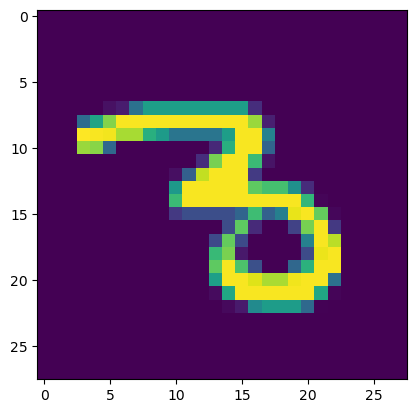

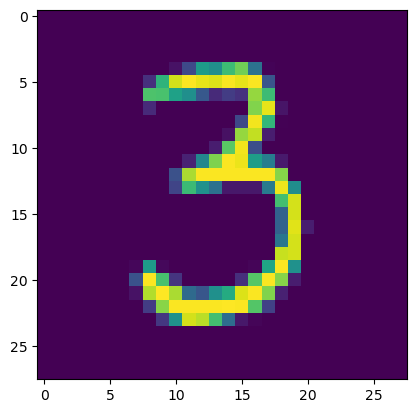

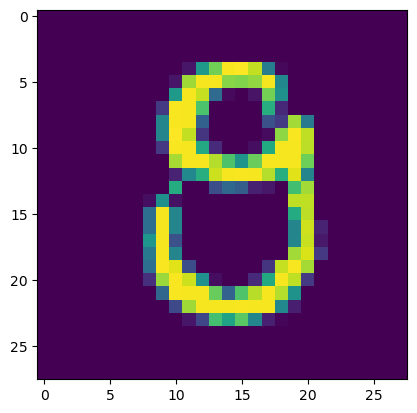

In [80]:
x = [50,70,80,90,20,30,50,80]
for i in x:
    plt.imshow(X[i], interpolation='nearest')
    plt.show()

In [81]:
XNormal = []
for i in range(len(X)):
    XNormal.append((X[i]/255))


In [82]:
XNormal

[array([[0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.

In [83]:
a = []

for i in range(len(XNormal)):
    a.append(XNormal[i].reshape(-1))

In [84]:
a = np.array(a)

In [85]:
XNormal[0]

array([[0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.    

In [86]:
a[0]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

In [87]:
class gaussBayesClassifier():
    
    def fit(self, X, y,epsilon):

        self.likelihoods = dict()
        
        self.priors = dict()
        
        self.K = set(y.astype(int))
        
        for k in self.K:
            # finds x_k where every column = k
            X_k = X[y==k,:]
            #finds the dimension of K
            N_k, D = X_k.shape
            #finds the mean of X_k
            #axis = 0 is accros the rows axis = 1 is accros the columns
            #if the array was 3d the axis would be accros the width
            mu_k = X_k.mean(axis=0)
            
            self.likelihoods[k] = {"mean": mu_k, 
                                   "cov": (1/(N_k-1))*np.matmul((X_k - mu_k).T,X_k-mu_k) + epsilon*np.identity(D)}
            
            self.priors[k] = len(X_k/len(X))
            
    def predict(self, X):
        N, D = X.shape
        
        P_hat = np.zeros((N, len(self.K)))
        for k,l in self.likelihoods.items():
            P_hat[:,k] = mvn.logpdf(X, l["mean"],l["cov"]) + np.log(self.priors[k])
            
        return P_hat.argmax(axis = 1)

In [88]:
class KNNClassifier():
    
    def fit(self, X, y):
        self.X = X
        self.y = y
        
    def predict(self, X, K,epsilon = 1e-3):
        N = len(X)
        y_hat = np.zeros(N)
        
        for i in range(N):
            dist2 = np.sum((self.X - X[i])**2, axis =1)
            
            idxt = np.argsort(dist2)[:K]
            
            gamma_k = 1/(np.sqrt(dist2[idxt]+epsilon))
            
            y_hat[i] = np.bincount(self.y[idxt], weights = gamma_k).argmax()
            
        return y_hat

In [125]:
class GaussNB():
    
    def fit(self,X,y, epsilon =1e-3):
        #the likelihoods
        self.likelihoods = dict()
        # the priors
        self.priors = dict()
        #Number of predicton types
        self.K = set(y.astype(int))
        
        for k in self.K:
            #calculates the mean
            X_k =X[y==k,:]
            
            self.likelihoods[k] ={"mean": X_k.mean(axis = 0), "cov": X_k.var(axis = 0) + epsilon}
            self.priors[k] =len(X_k)/len(X)
            
            
    def predict(self,X): 
        
        N, D = X.shape
        
        P_hat = np.zeros((N,len(self.K)))
        
        for k, l in self.likelihoods.items():
            #Apply Bayes Theorem
            P_hat[:,k] = mvn.logpdf(X,l["mean"],l["cov"])+np.log(self.priors[k])
            
        return P_hat.argmax(axis = 1)
    

In [126]:
NBC = GaussNB()

In [127]:
NBC.fit(a,y)

In [129]:
y_hatNBC = NBC.predict(a)

In [130]:
predict(y,y_hatNBC)

NameError: name 'predict' is not defined

In [89]:
GBC = gaussBayesClassifier()

In [90]:
GBC.fit(a,y,epsilon = 1e-2)

In [91]:
a.shape

(60000, 784)

In [92]:
y_hat = GBC.predict(a)

In [93]:
def accuracy(y,y_hat):
    return np.mean(y==y_hat)

In [94]:
accuracy(y,y_hat)

0.9555333333333333

Text(0.5, 47.7222222222222, 'Predicted label')

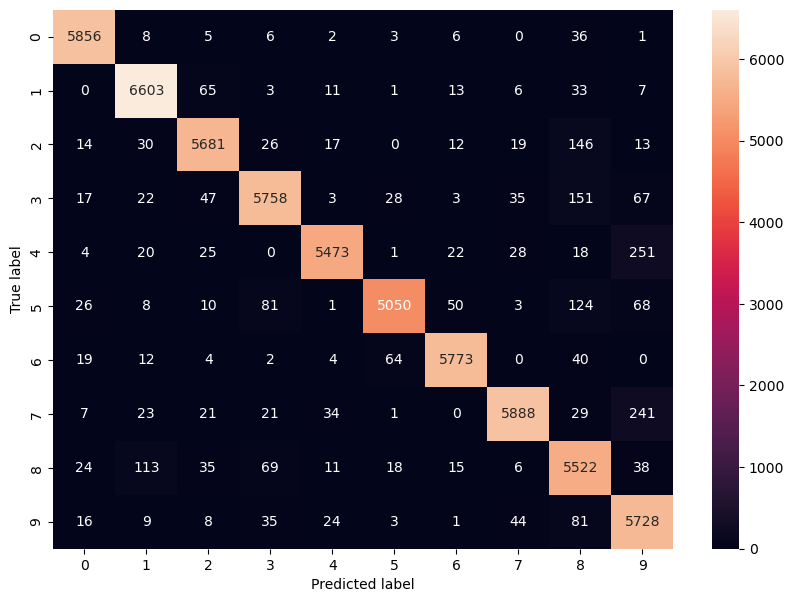

In [95]:
plt.figure(figsize=(10,7))
y_actu = pd.Series(y, name='Actual')
y_pred = pd.Series(y_hat, name='Predicted')
cm = pd.crosstab(y_actu, y_pred)
ax = sns.heatmap(cm, annot=True, fmt="d")
plt.ylabel('True label')
plt.xlabel('Predicted label')

In [96]:
KNN = KNNClassifier()

In [97]:
KNN.fit(a,y)

In [98]:
starttime = timeit.default_timer()
y_hatKNN = KNN.predict(a,5)
timerKNNTrain = ("The time difference is :", timeit.default_timer() - starttime)

In [99]:
print(timerKNNTrain)

('The time difference is :', 20797.30141300001)


In [117]:
accuracy(y,y_hatKNN)

1.0

Text(0.5, 47.7222222222222, 'Predicted label')

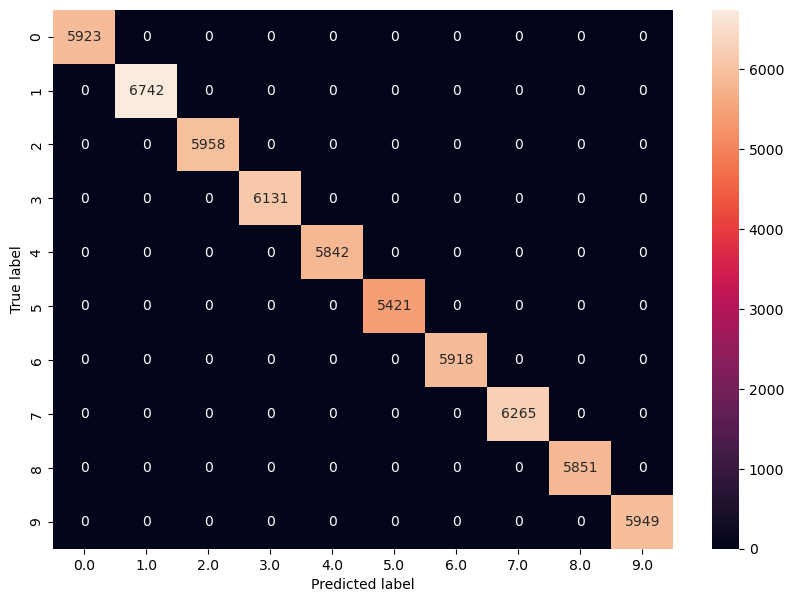

In [119]:
plt.figure(figsize=(10,7))
y_actu = pd.Series(y, name='Actual')
y_pred = pd.Series(y_hatKNN, name='Predicted')
cm = pd.crosstab(y_actu, y_pred)
ax = sns.heatmap(cm, annot=True, fmt="d")
plt.ylabel('True label')
plt.xlabel('Predicted label')

In [102]:
dfTest = pd.read_csv("C:\\Users\\liamh\\Downloads\\MNIST_test.csv - MNIST_test.csv.csv")

In [103]:
del dfTest["Unnamed: 0"]


In [104]:
dfTest = dfTest.to_numpy()

In [105]:
XTest = dfTest[:,2:]
yTest = dfTest[:,1]

In [106]:
XTest = XTest/255

In [107]:
starttime = timeit.default_timer()
y_hatKNNTest = KNN.predict(XTest,5)
timerKNNTest = ("The time difference is :", timeit.default_timer() - starttime)

In [109]:
print(timerKNNTest)

('The time difference is :', 3705.504878800013)


In [110]:
accuracy(yTest,y_hatKNNTest)

0.9691

Text(0.5, 47.7222222222222, 'Predicted label')

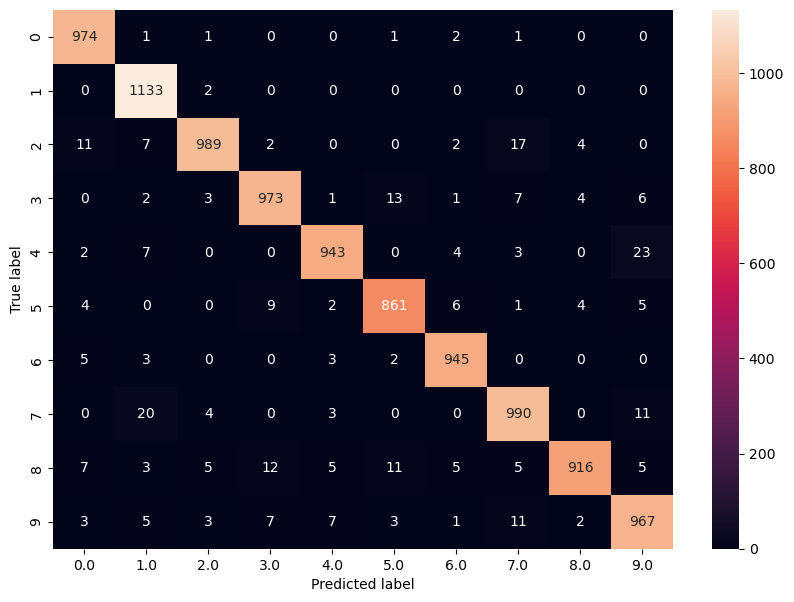

In [111]:
plt.figure(figsize=(10,7))
y_actu = pd.Series(yTest, name='Actual')
y_pred = pd.Series(y_hatKNNTest, name='Predicted')
cm = pd.crosstab(y_actu, y_pred)
ax = sns.heatmap(cm, annot=True, fmt="d")
plt.ylabel('True label')
plt.xlabel('Predicted label')

In [112]:
y_hatGBCTest = GBC.predict(XTest)

In [113]:
accuracy(yTest, y_hatGBCTest)

0.9473

Text(0.5, 47.7222222222222, 'Predicted label')

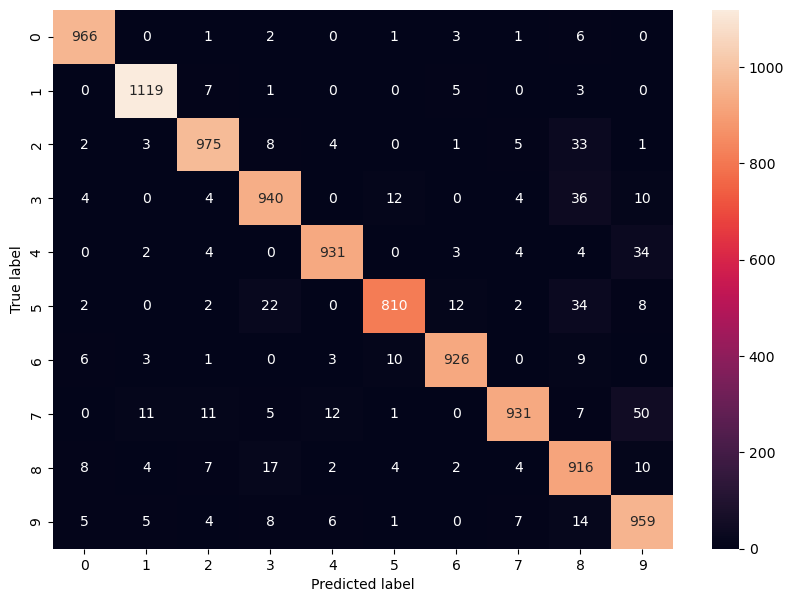

In [114]:
plt.figure(figsize=(10,7))
y_actu = pd.Series(yTest, name='Actual')
y_pred = pd.Series(y_hatGBCTest, name='Predicted')
cm = pd.crosstab(y_actu, y_pred)
ax = sns.heatmap(cm, annot=True, fmt="d")
plt.ylabel('True label')
plt.xlabel('Predicted label')

In [115]:
XTrain.shape

(10000, 784)